In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import glasbey

import time
import pickle
import memory_profiler

%load_ext memory_profiler
from pathlib import Path

In [3]:
import black
import jupyter_black

jupyter_black.load(line_length=79)

In [4]:
%load_ext autoreload
%autoreload 2


from pubmed_landscape_src.plotting import (
    plot_tsne_colors,
)

In [5]:
variables_path = Path("../../results/variables")
figures_path = Path("../../results/figures")
berenslab_data_path = Path("/gpfs01/berens/data/data/pubmed_processed")

In [6]:
plt.style.use("../matplotlib_style.txt")

# Import

In [32]:
# import clean_df_updated
clean_df_updated_reparsed_filtered = pd.read_pickle(
    berenslab_data_path
    / "clean_df_updated_reparsed_filtered_with_authors_ISSN"
)

In [33]:
tsne_reparsed = np.load(variables_path / "tsne_reparsed.npy")

In [34]:
tsne_old = np.vstack((-tsne_reparsed[:, 0], tsne_reparsed[:, 1])).T

# First author's affiliation

## Country mapping
With USA corrected

In [ ]:
%%time
%%memit
# import clean_2024_df

clean_2024_df = pd.read_pickle("../results/variables/2024_baseline/clean_2024_df")

peak memory: 73167.80 MiB, increment: 24274.66 MiB
CPU times: user 1min 6s, sys: 57.5 s, total: 2min 3s
Wall time: 2min 12s


In [40]:
countries_first_author_2024_usa_corrected = np.load(
    "../results/variables/2024_baseline/countries_first_author_2024_usa_corrected.npy"
)
# legend colors
pickle_in = open(
    "../results/variables/2024_baseline/colors_countries_legend_2024.pkl",
    "rb",
)
colors_countries_legend_2024 = pickle.load(pickle_in)

In [41]:
dict_pmids_countries = dict(
    zip(
        clean_2024_df.PMID.to_list(), countries_first_author_2024_usa_corrected
    )
)

In [42]:
%%time
countries_first_author_usa_corrected = np.vectorize(dict_pmids_countries.get)(
    clean_df_updated_reparsed_filtered.PMID.to_list()
)

# add unknown to the rest of papers
countries_first_author_usa_corrected = np.where(
    countries_first_author_usa_corrected == None,
    "unknown",
    countries_first_author_usa_corrected,
)
countries_first_author_usa_corrected = np.where(
    countries_first_author_usa_corrected == "None",
    "unknown",
    countries_first_author_usa_corrected,
)

CPU times: user 16.4 s, sys: 2.79 s, total: 19.2 s
Wall time: 19.1 s


In [43]:
np.save(
    variables_path / "countries_first_author_usa_corrected",
    countries_first_author_usa_corrected,
)

In [44]:
countries_first_author_usa_corrected

array(['unknown', 'unknown', 'unknown', ..., 'unknown', 'Italy', 'China'],
      dtype='<U32')

In [45]:
countries_first_author_usa_corrected.shape

(20687150,)

In [46]:
np.sum(
    countries_first_author_usa_corrected != "unknown"
) / countries_first_author_usa_corrected.shape[0] * 100

84.13424275456019

In [8]:
np.sum(countries_first_author_usa_corrected != "unknown")

17404977

### Color 10 countries

#### Create colors

In [7]:
# load
countries_first_author_usa_corrected = np.load(
    variables_path / "countries_first_author_usa_corrected.npy"
)

In [47]:
%%time

colors_countries_first_author_usa_corrected = np.vectorize(
    colors_countries_legend_2024.get
)(countries_first_author_usa_corrected)

# add grey to the rest of papers
colors_countries_first_author_usa_corrected = np.where(
    colors_countries_first_author_usa_corrected == None,
    "lightgrey",
    colors_countries_first_author_usa_corrected,
)
colors_countries_first_author_usa_corrected = np.where(
    colors_countries_first_author_usa_corrected == "None",
    "lightgrey",
    colors_countries_first_author_usa_corrected,
)

CPU times: user 4.12 s, sys: 698 ms, total: 4.82 s
Wall time: 4.81 s


In [48]:
np.save(
    variables_path / "colors_countries_first_author_usa_corrected",
    colors_countries_first_author_usa_corrected,
)

#### Plot

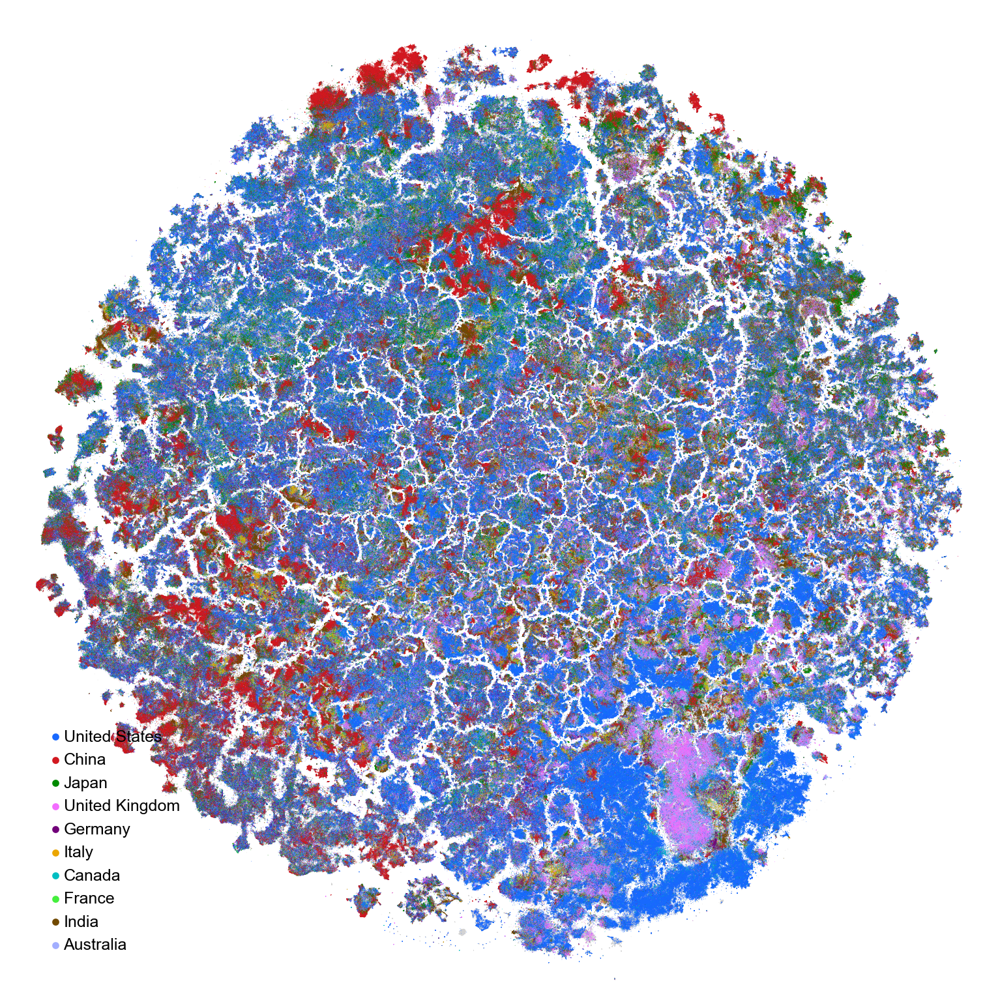

In [49]:
%matplotlib inline

fig, ax = plt.subplots(figsize=(5, 5), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")
x_lim = (-230, 230)
y_lim = (-230, 230)


plot_tsne_colors(
    tsne_old,
    colors_countries_first_author_usa_corrected,
    x_lim=x_lim,
    y_lim=y_lim,
    ax=ax,
    plot_type="subplot_2",
)

all_keys = []
for key, value in colors_countries_legend_2024.items():
    key = ax.scatter([], [], c=value, s=10, alpha=1, label=key)
    all_keys.append(key)

ax.legend(
    handles=all_keys,
    loc="lower left",
    fontsize=6,
    frameon=False,
    borderpad=0.2,
    handletextpad=0,
    handlelength=1,
    borderaxespad=1.5,
)  # -0.2 before


fig.savefig(figures_path / "tsne_colored_by_country_usa_corrected_v1.png")

### Color 10 countries (black)

#### Create colors

In [55]:
# load
countries_first_author_usa_corrected = np.load(
    variables_path / "countries_first_author_usa_corrected.npy"
)
colors_countries_first_author_usa_corrected = np.load(
    variables_path / "colors_countries_first_author_usa_corrected.npy",
    allow_pickle=True,
)

In [12]:
# legend colors
pickle_in = open(
    "../../results/variables/2024_baseline/colors_countries_legend_2024.pkl",
    "rb",
)
colors_countries_legend_2024 = pickle.load(pickle_in)

In [61]:
%%time
colors_countries_first_author_usa_corrected_with_black = np.where(
    colors_countries_first_author_usa_corrected == "lightgrey",
    "#474747",
    colors_countries_first_author_usa_corrected,
)
colors_countries_first_author_usa_corrected_with_black = np.where(
    countries_first_author_usa_corrected == "unknown",
    "lightgrey",
    colors_countries_first_author_usa_corrected_with_black,
)

CPU times: user 1.05 s, sys: 21.9 ms, total: 1.07 s
Wall time: 1.07 s


In [62]:
np.save(
    variables_path / "colors_countries_first_author_usa_corrected_with_black",
    colors_countries_first_author_usa_corrected_with_black,
)

#### Plot

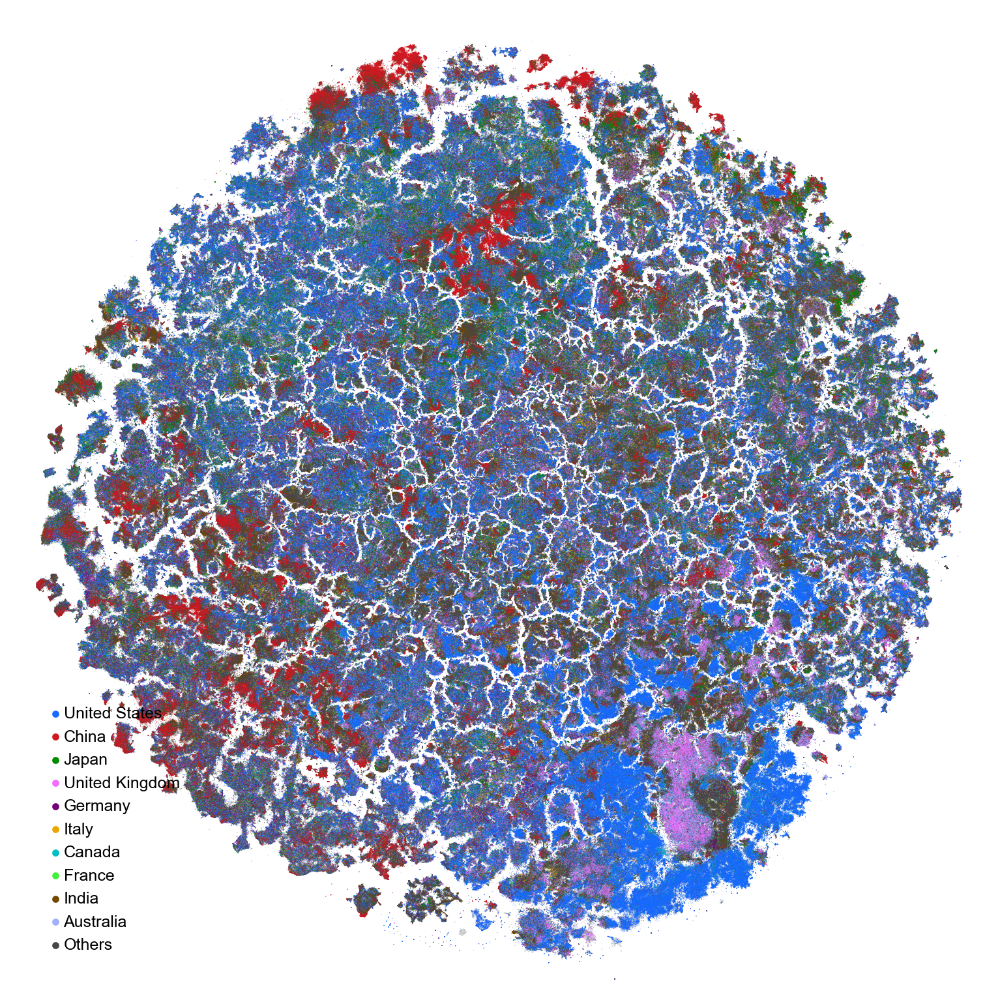

In [63]:
%matplotlib inline

fig, ax = plt.subplots(figsize=(5, 5), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")
x_lim = (-230, 230)
y_lim = (-230, 230)


plot_tsne_colors(
    tsne_old,
    colors_countries_first_author_usa_corrected_with_black,
    x_lim=x_lim,
    y_lim=y_lim,
    ax=ax,
    plot_type="subplot_2",
)

all_keys = []
for key, value in colors_countries_legend_2024.items():
    key = ax.scatter([], [], c=value, s=10, alpha=1, label=key)
    all_keys.append(key)

key = ax.scatter([], [], c="#474747", s=10, alpha=1, label="Others")
all_keys.append(key)

ax.legend(
    handles=all_keys,
    loc="lower left",
    fontsize=6,
    frameon=False,
    borderpad=0.2,
    handletextpad=0,
    handlelength=1,
    borderaxespad=1.5,
)  # -0.2 before


fig.savefig(
    figures_path
    / "tsne_colored_by_country_n_10_and_black_usa_corrected_v4.png"
)